In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Importing the basic libraries & loading the dataset**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings

# Filter specific warnings
warnings.filterwarnings('ignore', category=UserWarning)

# Filter all warnings (use cautiously)
warnings.filterwarnings('ignore')

# Update this path to point to your CSV file in Google Drive
path = '/content/drive/MyDrive/Case Studies/Credit_score.csv'

# Read the CSV file into a pandas DataFrame
df = pd.read_csv(path)

# Display the first few rows of the DataFrame
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,Low_spent_Large_value_payments,284.6291625
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098629
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,Low_spent_Small_value_payments,223.4513097
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,High_spent_Medium_value_payments,341.489231


In [ ]:
# finding the dimensions of the data

df.shape

(100000, 27)

- Here, there are 1,00,000 rows & 27 columns

In [ ]:
# getting the columns

df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance'],
      dtype='object')

In [ ]:
# Finding the data types of the columns

df.dtypes

,0
ID,object
Customer_ID,object
Month,object
Name,object
Age,object
SSN,object
Occupation,object
Annual_Income,object
Monthly_Inhand_Salary,float64
Num_Bank_Accounts,int64


In [ ]:
# Updating the columns with the suitable data types

# Updating data types
#df['Month'] = pd.to_datetime(df['Month'], errors='coerce')  # Converting 'Month' to datetime
df['Age'] = pd.to_numeric(df['Age'], errors='coerce')  # Converting 'Age' to int
df['Annual_Income'] = pd.to_numeric(df['Annual_Income'], errors='coerce')  # Converting 'Annual_Income' to float
df['Num_of_Loan'] = pd.to_numeric(df['Num_of_Loan'], errors='coerce')  # Converting 'Num_of_Loan' to int
df['Num_of_Delayed_Payment'] = pd.to_numeric(df['Num_of_Delayed_Payment'], errors='coerce')  # Converting 'Num_of_Delayed_Payment' to int
df['Changed_Credit_Limit'] = pd.to_numeric(df['Changed_Credit_Limit'], errors='coerce')  # Converting 'Changed_Credit_Limit' to float
df['Outstanding_Debt'] = pd.to_numeric(df['Outstanding_Debt'], errors='coerce')  # Converting 'Outstanding_Debt' to float
df['Credit_History_Age'] = pd.to_numeric(df['Credit_History_Age'], errors='coerce')  # Converting 'Credit_History_Age' to int
df['Amount_invested_monthly'] = pd.to_numeric(df['Amount_invested_monthly'], errors='coerce')  # Converting 'Amount_invested_monthly' to float
df['Monthly_Balance'] = pd.to_numeric(df['Monthly_Balance'], errors='coerce')  # Converting 'Monthly_Balance' to float


In [ ]:
# Checking the data type of the colunmn

df.dtypes

,0
ID,object
Customer_ID,object
Month,object
Name,object
Age,float64
SSN,object
Occupation,object
Annual_Income,float64
Monthly_Inhand_Salary,float64
Num_Bank_Accounts,int64


In [ ]:
# Finding the no. of unique values in the columns: ID, Customer_ID

df[['ID', 'Customer_ID']].nunique()

,0
ID,100000
Customer_ID,12500


- Here, ID column is unique in overall row-wise.
- Column Customer_ID is having some repeted no. of customers.

In [ ]:
# Lets find the SSN of the df is same or not.....

df['SSN'].nunique()

12501

### Finding the null values

In [ ]:
df.isnull().sum()

,0
ID,0
Customer_ID,0
Month,0
Name,9985
Age,4939
SSN,0
Occupation,0
Annual_Income,6980
Monthly_Inhand_Salary,15002
Num_Bank_Accounts,0


- From the dataframe, the columns 'ID', 'Name', 'Credit_History_Age' are not impacting. So, we are removing these rows.

In [ ]:
# Removing the ID, Customer_ID, Name as these are not use full

df = df.drop(['ID', 'Name', 'Credit_History_Age'], axis=1)

df.head()

,Customer_ID,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,...,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,CUS_0xd40,January,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,...,11.27,4.0,_,809.98,26.822620,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089
1,CUS_0xd40,February,23.0,821-00-0265,Scientist,19114.12,NaN,3,4,3,...,11.27,4.0,Good,809.98,31.944960,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629163
2,CUS_0xd40,March,-500.0,821-00-0265,Scientist,19114.12,NaN,3,4,3,...,NaN,4.0,Good,809.98,28.609352,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863
3,CUS_0xd40,April,23.0,821-00-0265,Scientist,19114.12,NaN,3,4,3,...,6.27,4.0,Good,809.98,31.377862,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310
4,CUS_0xd40,May,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,...,11.27,4.0,Good,809.98,24.797347,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231


In [ ]:
occupation_counts = df['Occupation'].value_counts()
occupation_counts

,count
Occupation,
_______,7062
Lawyer,6575
Architect,6355
Engineer,6350
Scientist,6299
Mechanic,6291
Accountant,6271
Developer,6235
Media_Manager,6232


In [ ]:
df['Occupation'].head(20)

,Occupation
0,Scientist
1,Scientist
2,Scientist
3,Scientist
4,Scientist
5,Scientist
6,Scientist
7,Scientist
8,_______
9,Teacher


In [ ]:
# Replace blank fields (empty strings or NaN) with 'Unknown' in the 'Occupation' column
df['Occupation'].replace('_______', 'Unknown', inplace=True)  # Replace empty strings
df['Occupation'].fillna('Unknown', inplace=True)  # Replace NaN values with 'Unknown'

# Display the updated column
df['Occupation'].value_counts()

,count
Occupation,
Unknown,7062
Lawyer,6575
Architect,6355
Engineer,6350
Scientist,6299
Mechanic,6291
Accountant,6271
Developer,6235
Media_Manager,6232


In [ ]:
# Calculate the mode of the 'Annual_Income' column
annual_income_mode = df['Annual_Income'].mode()[0]

# Replace NaN values with the mode
df['Annual_Income'].fillna(annual_income_mode, inplace=True)

# Check the number of null values in 'Annual_Income' after filling
missing_values_count = df['Annual_Income'].isnull().sum()
print(f"Missing values in 'Annual_Income' after filling: {missing_values_count}")

Missing values in 'Annual_Income' after filling: 0


In [ ]:
df['Monthly_Inhand_Salary'].value_counts()

,count
Monthly_Inhand_Salary,
6769.130000,15
6358.956667,15
2295.058333,15
6082.187500,15
3080.555000,14
...,...
1087.546445,1
3189.212103,1
5640.117744,1


In [ ]:
# Calculate the mean while ignoring NaN values
mean_salary = df['Monthly_Inhand_Salary'].mean()

# Replace NaN values with the mean
df['Monthly_Inhand_Salary'].fillna(mean_salary, inplace=True)

df['Monthly_Inhand_Salary'].isnull().sum()

0

In [ ]:
df['Num_Bank_Accounts'].value_counts()

,count
Num_Bank_Accounts,
6,13001
7,12823
8,12765
4,12186
5,12118
...,...
1626,1
1470,1
887,1


In [ ]:
df['Num_Credit_Card'].value_counts()

,count
Num_Credit_Card,
5,18459
7,16615
6,16559
4,14030
3,13277
...,...
791,1
1118,1
657,1


In [ ]:
df['Num_of_Loan'].value_counts()

,count
Num_of_Loan,
3.0,14386
2.0,14250
4.0,14016
0.0,10380
1.0,10083
...,...
1444.0,1
392.0,1
841.0,1


In [ ]:
df['Type_of_Loan'].value_counts().head(10)

,count
Type_of_Loan,
Not Specified,1408
Credit-Builder Loan,1280
Personal Loan,1272
Debt Consolidation Loan,1264
Student Loan,1240
Payday Loan,1200
Mortgage Loan,1176
Auto Loan,1152
Home Equity Loan,1136


In [ ]:
# Print the number of null values in the 'Type_of_Loan' column before replacement
print("Number of nulls before replacement:", df['Type_of_Loan'].isnull().sum())

# Calculate the mode of the 'Type_of_Loan' column
mode_loan_type = df['Type_of_Loan'].mode()[0]  # mode() returns a Series, so we take the first value

# Replace null values in the 'Type_of_Loan' column with the mode
df['Type_of_Loan'].fillna(mode_loan_type, inplace=True)

# Print the number of null values in the 'Type_of_Loan' column after replacement
print("Number of nulls after replacement:", df['Type_of_Loan'].isnull().sum())

Number of nulls before replacement: 11408
Number of nulls after replacement: 0


In [ ]:
df['Num_of_Delayed_Payment'].value_counts()

,count
Num_of_Delayed_Payment,
19.0,5327
17.0,5261
16.0,5173
10.0,5153
18.0,5083
...,...
1530.0,1
1502.0,1
4075.0,1


In [ ]:
# Calculate the mode of the 'Num_of_Delayed_Payment' column
mode_delayed_payments = df['Num_of_Delayed_Payment'].mode()[0]  # mode() returns a Series, so take the first value

# Replace null values in the 'Num_of_Delayed_Payment' column with the mode
df['Num_of_Delayed_Payment'].fillna(mode_delayed_payments, inplace=True)

# Print the number of null values in the 'Num_of_Delayed_Payment' column after replacement
print("Number of nulls after replacement:", df['Num_of_Delayed_Payment'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:
# Calculate the maximum value of the 'Changed_Credit_Limit' column
max_credit_limit = df['Changed_Credit_Limit'].max()

# Replace null values in the 'Changed_Credit_Limit' column with the maximum value
df['Changed_Credit_Limit'].fillna(max_credit_limit, inplace=True)

# Print the number of null values in the 'Changed_Credit_Limit' column after replacement
print("Number of nulls after replacement:", df['Changed_Credit_Limit'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:
df['Changed_Credit_Limit'].value_counts() # doubt

,count
Changed_Credit_Limit,
36.97,2092
8.22,135
11.50,127
11.32,126
7.35,121
...,...
-3.53,1
26.25,1
31.94,1


In [ ]:
# Calculate the mode of the 'Num_Credit_Inquiries' column
mode_credit_inquiries = df['Num_Credit_Inquiries'].mode()[0]  # mode() returns a Series, so take the first value

# Replace null values in the 'Num_Credit_Inquiries' column with the mode
df['Num_Credit_Inquiries'].fillna(mode_credit_inquiries, inplace=True)

# Print the number of null values in the 'Num_Credit_Inquiries' column after replacement
print("Number of nulls after replacement:", df['Num_Credit_Inquiries'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:
df['Outstanding_Debt'].value_counts()

,count
Outstanding_Debt,
1360.45,24
1109.03,23
460.46,23
1151.70,23
2536.84,16
...,...
533.41,6
4632.72,6
4138.67,6


In [ ]:
# Calculate the median of the 'Outstanding_Debt' column
median_outstanding_debt = df['Outstanding_Debt'].median()

# Replace null values in the 'Outstanding_Debt' column with the median
df['Outstanding_Debt'].fillna(median_outstanding_debt, inplace=True)

# Print the number of null values in the 'Outstanding_Debt' column after replacement
print("Number of nulls after replacement:", df['Outstanding_Debt'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:
df['Num_Credit_Inquiries'].value_counts()

,count
Num_Credit_Inquiries,
4.0,13236
3.0,8890
6.0,8111
7.0,8058
2.0,8028
...,...
1721.0,1
1750.0,1
2397.0,1


In [ ]:
df['Credit_Mix'].value_counts()

,count
Credit_Mix,
Standard,36479
Good,24337
_,20195
Bad,18989


In [ ]:
df['Outstanding_Debt'].value_counts() #null

,count
Outstanding_Debt,
1166.37,1017
1360.45,24
460.46,23
1109.03,23
1151.70,23
...,...
897.82,6
1048.02,6
310.76,6


In [ ]:
df['Credit_Utilization_Ratio'].value_counts()

,count
Credit_Utilization_Ratio,
26.407909,2
33.163023,2
26.822620,1
30.462162,1
33.933755,1
...,...
38.730069,1
30.017515,1
27.279794,1


In [ ]:
df['Payment_of_Min_Amount'].value_counts()

,count
Payment_of_Min_Amount,
Yes,52326
No,35667
NM,12007


In [ ]:
# Calculate the mean of the 'Outstanding_Debt' column
mean_outstanding_debt = df['Outstanding_Debt'].mean()

# Replace null values in the 'Outstanding_Debt' column with the mean
df['Outstanding_Debt'].fillna(mean_outstanding_debt, inplace=True)

# Print the number of null values in the 'Outstanding_Debt' column after replacement
print("Number of nulls after replacement:", df['Outstanding_Debt'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:
df['Total_EMI_per_month'].value_counts()

,count
Total_EMI_per_month,
0.000000,10613
49.574949,8
73.533361,8
22.960835,8
38.661127,8
...,...
36408.000000,1
23760.000000,1
24612.000000,1


In [ ]:
df['Amount_invested_monthly'].value_counts()

,count
Amount_invested_monthly,
0.000000,169
80.415295,1
189.419067,1
89.738489,1
59.937258,1
...,...
36.541909,1
93.451163,1
140.809722,1


In [ ]:
# Calculate the mean of the 'Amount_invested_monthly' column
mean_amount_invested = df['Amount_invested_monthly'].mean()

# Replace null values in the 'Amount_invested_monthly' column with the mean
df['Amount_invested_monthly'].fillna(mean_amount_invested, inplace=True)

# Print the number of null values in the 'Amount_invested_monthly' column after replacement
print("Number of nulls after replacement:", df['Amount_invested_monthly'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:
df['Monthly_Balance'].value_counts()

,count
Monthly_Balance,
350.014869,2
695.057156,2
312.494089,1
347.413890,1
254.970922,1
...,...
280.686232,1
366.289038,1
151.188270,1


In [ ]:
Monthly_Balance_mode = df['Monthly_Balance'].mode()[0]
df['Monthly_Balance'].fillna(Monthly_Balance_mode, inplace=True)
print("Number of nulls after replacement:", df['Monthly_Balance'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:
df['Payment_Behaviour'].value_counts()

,count
Payment_Behaviour,
Low_spent_Small_value_payments,25513
High_spent_Medium_value_payments,17540
Low_spent_Medium_value_payments,13861
High_spent_Large_value_payments,13721
High_spent_Small_value_payments,11340
Low_spent_Large_value_payments,10425
!@9#%8,7600


In [ ]:
# Replace specific values in the 'Payment_Behaviour' column
df['Payment_Behaviour'].replace('!@9#%8', 'Low_spent_Small_value_payments', inplace=True)

# Check for the number of null values in the 'Payment_Behaviour' column
null_count = df['Payment_Behaviour'].isnull().sum()

# Print the number of null values
print("Number of nulls after replacement:", null_count)

Number of nulls after replacement: 0


In [ ]:
# Calculate the average (mean) of the 'Num_of_Loan' column
average_num_of_loans = df['Num_of_Loan'].mean()

# Replace null values in the 'Num_of_Loan' column with the average
df['Num_of_Loan'].fillna(average_num_of_loans, inplace=True)

# Print the number of null values in the 'Num_of_Loan' column after replacement
print("Number of nulls after replacement:", df['Num_of_Loan'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:
df['Age'].value_counts()

,count
Age,
38.0,2833
28.0,2829
31.0,2806
26.0,2792
32.0,2749
...,...
5741.0,1
7178.0,1
5621.0,1


In [ ]:
df['Age'].isnull().sum()

4939

In [ ]:
# Calculate the average (mean) of the 'Age' column
average_age = df['Age'].mean()

# Replace null values in the 'Age' column with the average
df['Age'].fillna(average_age, inplace=True)

# Print the number of null values in the 'Age' column after replacement
print("Number of nulls after replacement:", df['Age'].isnull().sum())

Number of nulls after replacement: 0


In [ ]:

# Display unique month values
print("Unique month values before conversion:")
print(df['Month'].unique())

# Check for missing values in the 'Month' column
df = df.dropna(subset=['Month'])

# Full month mapping
month_mapping_full = {
    'January': 1,
    'February': 2,
    'March': 3,
    'April': 4,
    'May': 5,
    'June': 6,
    'July': 7,
    'August': 8,
    'September': 9,
    'October': 10,
    'November': 11,
    'December': 12
}

# Convert month to numerical format
df['Month_Number'] = df['Month'].map(month_mapping_full)

# Display the updated DataFrame
print("\nUpdated DataFrame:")
df.head()

Unique month values before conversion:
['January' 'February' 'March' 'April' 'May' 'June' 'July' 'August']

Updated DataFrame:


,Customer_ID,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Month_Number
0,CUS_0xd40,January,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,...,4.0,_,809.98,26.822620,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,1
1,CUS_0xd40,February,23.0,821-00-0265,Scientist,19114.12,4194.170850,3,4,3,...,4.0,Good,809.98,31.944960,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629163,2
2,CUS_0xd40,March,-500.0,821-00-0265,Scientist,19114.12,4194.170850,3,4,3,...,4.0,Good,809.98,28.609352,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,3
3,CUS_0xd40,April,23.0,821-00-0265,Scientist,19114.12,4194.170850,3,4,3,...,4.0,Good,809.98,31.377862,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,4
4,CUS_0xd40,May,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,...,4.0,Good,809.98,24.797347,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,5


In [ ]:
df['Month'].value_counts()

,count
Month,
January,12500
February,12500
March,12500
April,12500
May,12500
June,12500
July,12500
August,12500


In [ ]:
df.isnull().sum()

,0
Customer_ID,0
Month,0
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,0
Num_Bank_Accounts,0
Num_Credit_Card,0
Interest_Rate,0


# Checking for the outliers

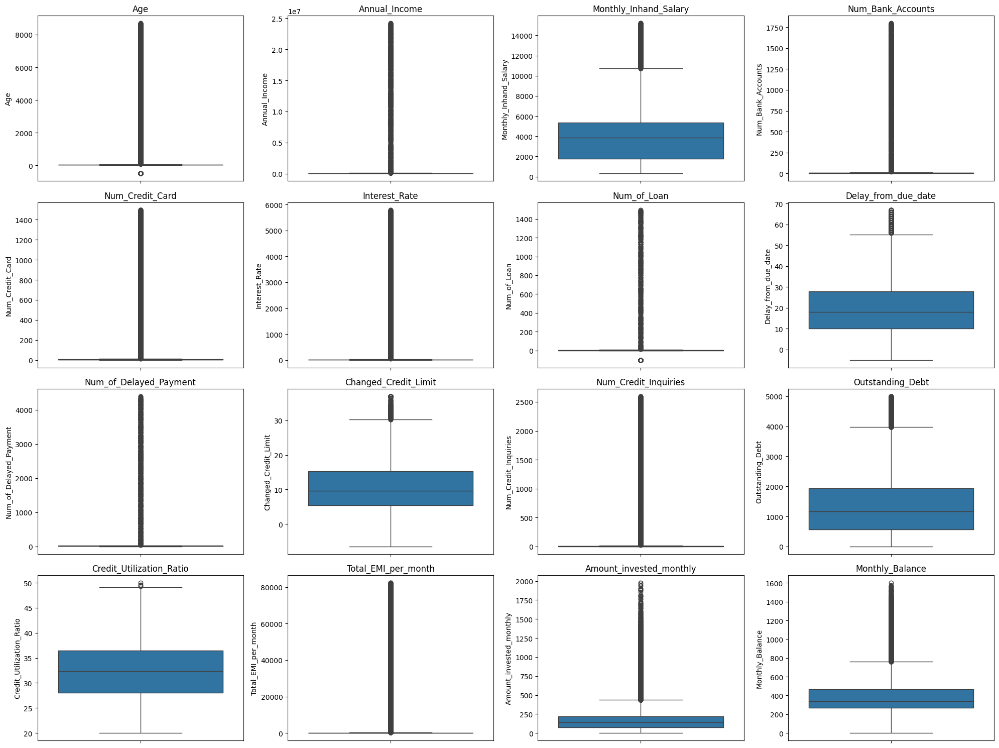

In [ ]:
# List of numerical columns
numerical_cols = ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
                  'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
                  'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
                  'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Total_EMI_per_month',
                  'Amount_invested_monthly', 'Monthly_Balance']

# Set up the matplotlib figure
plt.figure(figsize=(20, 15))

# Create a boxplot for each numerical column
for i, column in enumerate(numerical_cols):
    plt.subplot(4, 4, i+1)
    sns.boxplot(data=df[column])
    plt.title(column)

plt.tight_layout()
plt.show()

1. **Outliers Detected**: Significant outliers in features like `Annual Income` and `Monthly Inhand Salary` indicate a wide income disparity among customers.

2. **Skewed Income Distribution**: The `Annual Income` distribution is highly skewed, suggesting varying financial capacities.

3. **Diverse Payment Behavior**: The `Num of Delayed Payment` feature reveals a wide range of values, indicating different payment habits among customers.

4. **Debt Management Concerns**: High values in `Outstanding Debt` point to potential creditworthiness issues for some individuals.

5. **Credit Utilization Insights**: Most customers maintain a low `Credit Utilization Ratio`, though outliers suggest some may struggle with credit management.

In [ ]:
# IQR Method
Q1 = df[numerical_cols].quantile(0.25)
Q3 = df[numerical_cols].quantile(0.75)
IQR = Q3 - Q1

# Identifying outliers based on IQR
outliers_iqr = (df[numerical_cols] < (Q1 - 1.5 * IQR)) | (df[numerical_cols] > (Q3 + 1.5 * IQR))

# Number of outliers per column
outlier_summary = outliers_iqr.sum()

# Show the rows containing outliers
outliers = df[outliers_iqr.any(axis=1)]

In [ ]:
print("Number of outliers per column:")
outlier_summary

Number of outliers per column:


,0
Age,7635
Annual_Income,2800
Monthly_Inhand_Salary,4365
Num_Bank_Accounts,1315
Num_Credit_Card,2271
Interest_Rate,2034
Num_of_Loan,4323
Delay_from_due_date,4002
Num_of_Delayed_Payment,717
Changed_Credit_Limit,2330


In [ ]:
print("\nOutliers in the dataset:")
outliers


Outliers in the dataset:


,Customer_ID,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Month_Number
2,CUS_0xd40,March,-500.000000,821-00-0265,Scientist,19114.12,4194.170850,3,4,3,...,4.0,Good,809.98,28.609352,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,3
8,CUS_0x21b1,January,110.934505,004-07-5839,Unknown,34847.84,3037.986667,2,4,6,...,2.0,Good,605.03,24.464031,No,18.816215,104.291825,Low_spent_Small_value_payments,470.690627,1
10,CUS_0x21b1,March,28.000000,004-07-5839,Teacher,17273.83,3037.986667,2,1385,6,...,2.0,_,605.03,33.224951,No,18.816215,58.515976,High_spent_Large_value_payments,466.466476,3
16,CUS_0x2dbc,January,34.000000,486-85-3974,Unknown,143162.64,12187.220000,1,5,8,...,3.0,Good,1303.01,28.616735,No,246.992320,168.413703,Low_spent_Small_value_payments,1043.315978,1
17,CUS_0x2dbc,February,34.000000,486-85-3974,Engineer,143162.64,12187.220000,1,5,8,...,3.0,Good,1303.01,41.702573,No,246.992320,232.860384,High_spent_Small_value_payments,998.869297,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99972,CUS_0xf16,May,1753.000000,868-70-2218,Media_Manager,16680.35,1528.029167,1,1,5,...,8.0,Good,897.16,37.788217,No,41.113561,64.549748,Low_spent_Large_value_payments,317.139608,5
99985,CUS_0x8600,February,28.000000,031-35-0942,Architect,20002.88,1929.906667,10,8,29,...,9.0,Bad,1166.37,39.772607,Yes,12112.000000,148.275233,Low_spent_Small_value_payments,273.750661,2
99987,CUS_0x8600,April,110.934505,031-35-0942,Architect,20002.88,1929.906667,10,8,29,...,9.0,_,3571.70,30.614953,Yes,60.964772,43.724617,High_spent_Large_value_payments,328.301277,4
99993,CUS_0x942c,February,25.000000,078-73-5990,Mechanic,17273.83,3359.415833,4,6,7,...,3.0,Good,502.38,29.135447,No,58638.000000,180.733095,Low_spent_Medium_value_payments,400.104466,2


# Graphs

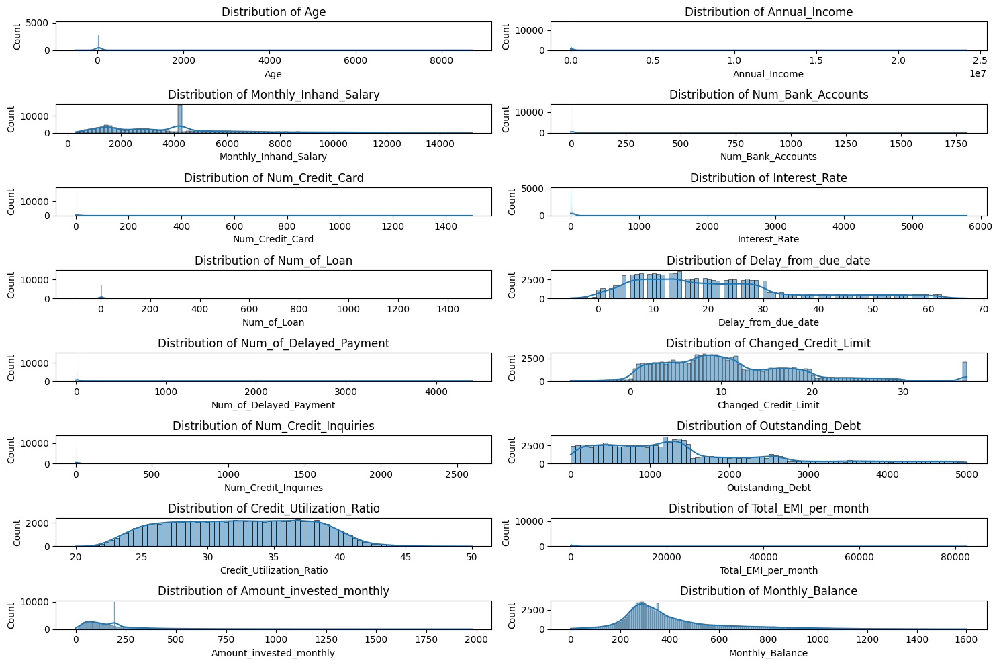

In [ ]:
### 1. HISTOGRAMS
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(8, 2, i+1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

### Inferences:

1. **Age Distribution**: Most customers are between 25 and 45, indicating a younger customer base.
2. **Income Insights**: A significant number have an annual income under ₹10 lakh, suggesting a middle-income demographic.
3. **Credit Utilization**: Most customers have a credit utilization ratio between 25% and 40%, indicating responsible credit use.
4. **Loan and Payment Behavior**: Many customers have fewer than three loans and minimal delayed payments, reflecting good credit management.
5. **Investment Trends**: Most customers invest less than ₹500 monthly, suggesting potential growth in financial product offerings.

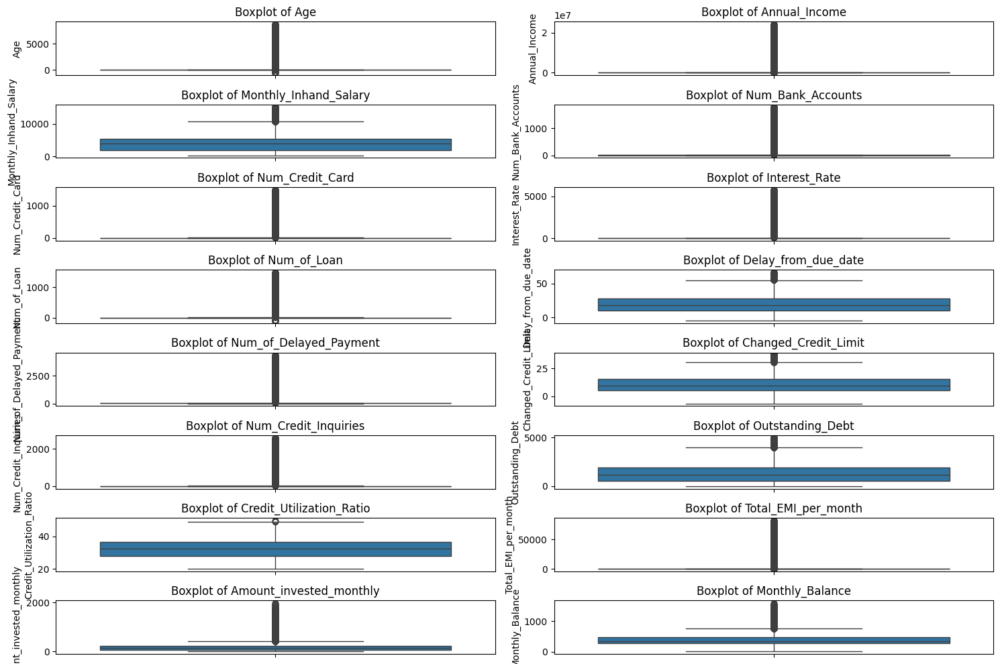

In [ ]:
### 2. BOXPLOTS
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(8, 2, i+1)
    sns.boxplot(data=df[col])
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

Here are key inferences from the boxplots:

1. **Age & Annual Income**: Both show extreme outliers, suggesting a wide range of values, though the majority are clustered at lower levels.
2. **Monthly Inhand Salary & Outstanding Debt**: Distributions are concentrated in a narrow range, with some outliers indicating higher values.
3. **Credit Variables**: Metrics like Credit Card Numbers, Loans, and Credit Inquiries have highly skewed distributions, with most data points near the lower end and significant outliers.
4. **Credit Utilization & Delayed Payments**: These variables show some variability but are mostly concentrated within certain bounds, with notable outliers.
5. **EMI & Monthly Balance**: These are generally consistent, but extreme values are present, indicating some users handle significantly higher amounts.

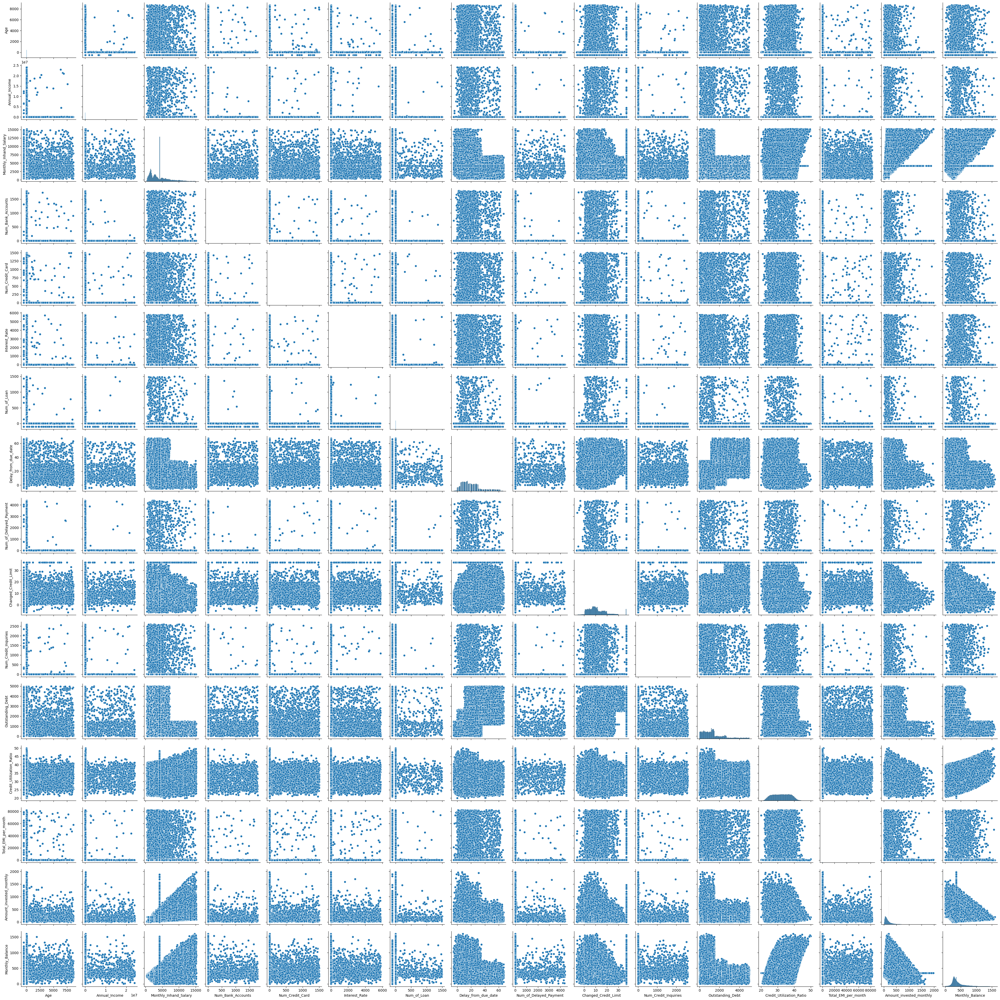

In [ ]:
### 3. SCATTER PLOTS (Pairwise Relationships)
# Pair plot to examine pairwise relationships between numerical variables
sns.pairplot(df[numerical_cols])
plt.show()

Inferences:

1. **Non-linear Relationships**: Most variable pairs exhibit no clear linear correlation, with scatter points widely spread, suggesting weak direct relationships.
2. **Some Positive Correlations**: A few variables, like *Total EMI per month* vs. *Outstanding Debt*, show a visible upward trend, indicating some positive relationships.
3. **Clustered Data**: For many variable combinations, data points are concentrated in certain regions, suggesting that most values are concentrated within specific ranges.
4. **Outliers**: Many scatter plots show outliers, indicating extreme values across multiple variables.
5. **Multimodal Distributions**: Some diagonal plots reveal multimodal distributions, meaning some variables have more than one cluster of values.

In [ ]:
### 4. CORRELATION MATRIX
# Compute correlation matrix for numerical columns
corr_matrix = df[numerical_cols].corr()

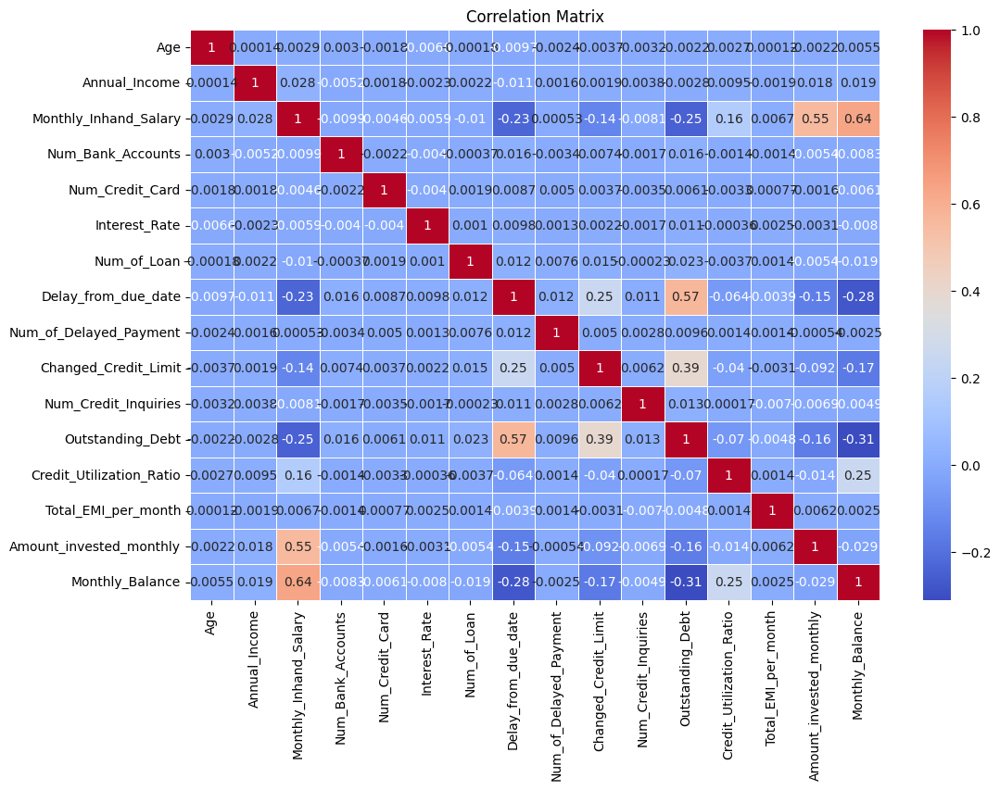

In [ ]:
# Display correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

Inferences:

1. **High Positive Correlation**: *Outstanding Debt* is highly correlated with *Total EMI per month* (0.64) and *Credit Utilization Ratio* (0.57), suggesting debt influences EMI and credit usage.
2. **Salary-Related Correlation**: *Monthly Inhand Salary* has a moderate positive correlation with *Amount Invested Monthly* (0.55) and *Monthly Balance* (0.64), showing that higher salary impacts investment and balance.
3. **Weak Correlations**: Most variables have very weak correlations (near 0), indicating limited linear relationships among the majority of features.
4. **Negative Relationships**: *Outstanding Debt* shows negative correlation with *Monthly Balance* (-0.31), indicating higher debt reduces available balance.
5. **No Correlation with Age**: Age shows almost no significant correlation with other financial variables, implying age alone doesn’t explain variations in financial behavior.

### 1. Debt-to-Income Ratio:

In [ ]:
df['Debt_to_Income_Ratio'] = df['Outstanding_Debt'] / df['Annual_Income']

### 2. Credit Utilization Rate:

In [ ]:
df['Credit_Utilization_Rate'] = df['Outstanding_Debt'] / df['Changed_Credit_Limit']

### 3. Annual Credit Inquiries Rate:

In [ ]:
df['Annual_Credit_Inquiries'] = df['Num_Credit_Inquiries'] / (df['Age'] / 12)

### 4. Loan-to-Income Ratio:

In [ ]:
df['Loan_to_Income_Ratio'] = df['Num_of_Loan'] / df['Annual_Income']

### 5. Delayed Payment Percentage:

In [ ]:
df['Delayed_Payment_Percentage'] = df['Num_of_Delayed_Payment'] / df['Num_of_Loan']

### 6. EMI-to-Income Ratio:

In [ ]:
df['EMI_to_Income_Ratio'] = df['Total_EMI_per_month'] / df['Monthly_Inhand_Salary']

### 7. Income Stability:

In [ ]:
df['Income_Stability'] = df['Monthly_Balance'] / df['Monthly_Inhand_Salary']

### 8. Credit Mix Score:

In [ ]:
credit_mix_map = {'Home Loan': 3, 'Personal Loan': 2, 'Credit Card Loan': 1}  # Example scoring
df['Credit_Mix_Score'] = df['Type_of_Loan'].map(credit_mix_map)

In [ ]:
df.columns

Index(['Customer_ID', 'Month', 'Age', 'SSN', 'Occupation', 'Annual_Income',
       'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Payment_of_Min_Amount',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour',
       'Monthly_Balance', 'Month_Number', 'Debt_to_Income_Ratio',
       'Credit_Utilization_Rate', 'Annual_Credit_Inquiries',
       'Loan_to_Income_Ratio', 'Delayed_Payment_Percentage',
       'EMI_to_Income_Ratio', 'Income_Stability', 'Credit_Mix_Score'],
      dtype='object')

In [ ]:
# Define aggregation functions
aggregation_functions = {
    'Age': 'mean',
    'Annual_Income': 'mean',
    'Monthly_Inhand_Salary': 'mean',
    'Num_Bank_Accounts': 'sum',
    'Num_Credit_Card': 'sum',
    'Interest_Rate': 'mean',
    'Num_of_Loan': 'sum',
    'Delay_from_due_date': 'mean',
    'Num_of_Delayed_Payment': 'sum',
    'Changed_Credit_Limit': 'mean',
    'Num_Credit_Inquiries': 'sum',
    'Outstanding_Debt': 'sum',
    'Credit_Utilization_Ratio': 'mean',
    'Total_EMI_per_month': 'sum',
    'Amount_invested_monthly': 'sum',
    'Monthly_Balance': 'mean',
    'Credit_Mix_Score': 'mean',
    'Debt_to_Income_Ratio': 'mean',
    'EMI_to_Income_Ratio': 'mean',
    'Loan_to_Income_Ratio': 'mean',
    'Delayed_Payment_Percentage': 'mean',
    'Income_Stability': 'mean',
    'Credit_Utilization_Rate': 'mean',
    'Annual_Credit_Inquiries': 'sum'
}

# Group by the new Customer_ID and aggregate
customer_aggregated_df = df.groupby('Customer_ID').agg(aggregation_functions).reset_index()

# Display the aggregated DataFrame
customer_aggregated_df.head()

,Customer_ID,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,...,Amount_invested_monthly,Monthly_Balance,Credit_Mix_Score,Debt_to_Income_Ratio,EMI_to_Income_Ratio,Loan_to_Income_Ratio,Delayed_Payment_Percentage,Income_Stability,Credit_Utilization_Rate,Annual_Credit_Inquiries
0,CUS_0x1000,29.116813,28956.92625,2892.162815,48,40,27.0,16.000000,62.25,200.0,...,1268.397882,335.375341,NaN,0.055963,0.015164,0.000072,12.500000,0.118825,867.695957,53.542832
1,CUS_0x1009,25.750000,47932.82375,4250.390000,48,40,17.0,1120.780339,7.25,1874.0,...,1173.435023,428.743155,NaN,0.007159,0.025496,0.002697,58.248810,0.100871,33.210817,11.150769
2,CUS_0x100b,18.500000,113781.39000,8880.331044,8,32,1.0,2.780339,13.50,59.0,...,3423.398071,781.229776,NaN,0.009054,0.000000,0.000003,inf,0.097894,87.058798,1522.315789
3,CUS_0x1011,60.733626,58918.47000,5082.034794,24,24,17.0,24.000000,27.25,127.0,...,2372.965856,332.642837,NaN,0.008030,0.024414,0.000051,5.291667,0.064814,33.422613,546.968953
4,CUS_0x1013,52.116813,98620.98000,6549.323444,24,24,6.0,24.000000,12.50,78.0,...,2843.539261,472.781009,NaN,0.012508,0.796692,0.000030,3.250000,0.081195,847.129148,6.089843


In [ ]:
df.columns

Index(['Customer_ID', 'Month', 'Age', 'SSN', 'Occupation', 'Annual_Income',
       'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Payment_of_Min_Amount',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour',
       'Monthly_Balance', 'Month_Number', 'Debt_to_Income_Ratio',
       'Credit_Utilization_Rate', 'Annual_Credit_Inquiries',
       'Loan_to_Income_Ratio', 'Delayed_Payment_Percentage',
       'EMI_to_Income_Ratio', 'Income_Stability', 'Credit_Mix_Score'],
      dtype='object')

In [ ]:
import pandas as pd

# Assuming you have your DataFrame named df with the necessary columns

# Convert relevant columns to numeric, forcing errors to NaN
numeric_columns = [
    'Payment_of_Min_Amount',
    'Credit_Utilization_Ratio',
    'Num_of_Delayed_Payment',
    'Outstanding_Debt',
    'Annual_Income',
    'Credit_Mix_Score',
    'Debt_to_Income_Ratio'
]

# Convert columns to numeric
for col in numeric_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Optional: Handle missing values (for example, fill with zeros or the mean)
df[numeric_columns] = df[numeric_columns].fillna(0)

# Normalization function
def normalize(series):
    return (series - series.min()) / (series.max() - series.min())

# Normalize the selected features
df['Payment_of_Min_Amount_Norm'] = normalize(df['Payment_of_Min_Amount'])
df['Credit_Utilization_Ratio_Norm'] = normalize(1 - df['Credit_Utilization_Ratio'])  # Lower utilization is better
df['Num_of_Delayed_Payment_Norm'] = normalize(1 - df['Num_of_Delayed_Payment'])  # Fewer delays is better
df['Outstanding_Debt_Norm'] = normalize(1 - df['Outstanding_Debt'])  # Lower debt is better
df['Annual_Income_Norm'] = normalize(df['Annual_Income'])
df['Credit_Mix_Score_Norm'] = normalize(df['Credit_Mix_Score'])
df['Debt_to_Income_Ratio_Norm'] = normalize(1 - df['Debt_to_Income_Ratio'])  # Lower ratio is better

# Assign weights
weights = {
    'Payment_of_Min_Amount_Norm': 0.20,
    'Credit_Utilization_Ratio_Norm': 0.25,
    'Num_of_Delayed_Payment_Norm': 0.15,
    'Outstanding_Debt_Norm': 0.10,
    'Annual_Income_Norm': 0.10,
    'Credit_Mix_Score_Norm': 0.10,
    'Debt_to_Income_Ratio_Norm': 0.10
}

# Calculate hypothetical credit score
df['Hypothetical_Credit_Score'] = (
    df[list(weights.keys())].multiply(list(weights.values()), axis=1).sum(axis=1)
)

# Scale the credit score to the FICO range (300-850)
df['Scaled_Credit_Score'] = 300 + ((df['Hypothetical_Credit_Score'] / df['Hypothetical_Credit_Score'].max()) * (850 - 300))

# Display the DataFrame with the new scores
df[['Customer_ID', 'Scaled_Credit_Score']]


,Customer_ID,Scaled_Credit_Score
0,CUS_0xd40,694.006689
1,CUS_0xd40,661.381415
2,CUS_0xd40,682.734639
3,CUS_0xd40,665.346224
4,CUS_0xd40,706.473928
...,...,...
99995,CUS_0x942c,652.554333
99996,CUS_0x942c,615.319711
99997,CUS_0x942c,610.993167
99998,CUS_0x942c,658.713396


In [ ]:
import pandas as pd

# Assuming you have your DataFrame named df with the necessary columns

# Convert relevant columns to numeric, forcing errors to NaN
numeric_columns = [
    'Payment_of_Min_Amount',
    'Credit_Utilization_Ratio',
    'Num_of_Delayed_Payment',
    'Outstanding_Debt',
    'Annual_Income',
    'Credit_Mix_Score',
    'Debt_to_Income_Ratio'
]

# Convert columns to numeric
for col in numeric_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Handle missing values (for example, fill with zeros or the mean)
df[numeric_columns] = df[numeric_columns].fillna(0)

# Normalization function
def normalize(series):
    return (series - series.min()) / (series.max() - series.min())

# Normalize the selected features
df['Payment_of_Min_Amount_Norm'] = normalize(df['Payment_of_Min_Amount'])
df['Credit_Utilization_Ratio_Norm'] = normalize(1 - df['Credit_Utilization_Ratio'])  # Lower utilization is better
df['Num_of_Delayed_Payment_Norm'] = normalize(1 - df['Num_of_Delayed_Payment'])  # Fewer delays is better
df['Outstanding_Debt_Norm'] = normalize(1 - df['Outstanding_Debt'])  # Lower debt is better
df['Annual_Income_Norm'] = normalize(df['Annual_Income'])
df['Credit_Mix_Score_Norm'] = normalize(df['Credit_Mix_Score'])
df['Debt_to_Income_Ratio_Norm'] = normalize(1 - df['Debt_to_Income_Ratio'])  # Lower ratio is better

# Assign weights based on Weighting Scheme 2
weights = {
    'Payment_of_Min_Amount_Norm': 0.20,
    'Credit_Utilization_Ratio_Norm': 0.25,
    'Num_of_Delayed_Payment_Norm': 0.15,
    'Outstanding_Debt_Norm': 0.10,
    'Annual_Income_Norm': 0.10,
    'Credit_Mix_Score_Norm': 0.10,
    'Debt_to_Income_Ratio_Norm': 0.10
}

# Calculate hypothetical credit score
df['Hypothetical_Credit_Score'] = (
    df[list(weights.keys())].multiply(list(weights.values()), axis=1).sum(axis=1)
)

# Scale the credit score to the FICO range (300-850)
df['Scaled_Credit_Score'] = 300 + ((df['Hypothetical_Credit_Score'] / df['Hypothetical_Credit_Score'].max()) * (850 - 300))

# Display the DataFrame with the new scores
df[['Customer_ID', 'Scaled_Credit_Score']]

,Customer_ID,Scaled_Credit_Score
0,CUS_0xd40,694.006689
1,CUS_0xd40,661.381415
2,CUS_0xd40,682.734639
3,CUS_0xd40,665.346224
4,CUS_0xd40,706.473928
...,...,...
99995,CUS_0x942c,652.554333
99996,CUS_0x942c,615.319711
99997,CUS_0x942c,610.993167
99998,CUS_0x942c,658.713396


### Hypothetical Credit Score Calculation Methodology

To calculate a hypothetical credit score inspired by FICO scores, we will use the following features:

1. **Payment of Minimum Amount**: Reflects payment commitment.
2. **Credit Utilization Ratio**: Lower ratios indicate better credit use.
3. **Number of Delayed Payments**: Fewer delays suggest reliability.
4. **Outstanding Debt**: Lower debt is preferable.
5. **Annual Income**: Indicates repayment capacity.
6. **Credit Mix Score**: A diverse credit portfolio is beneficial.
7. **Debt-to-Income Ratio**: Lower ratios signify manageable debt.

Features will be normalized to a 0-1 scale, and weights will be assigned based on their importance. The score is calculated as a weighted sum and scaled to the FICO range of 300-850, offering a comprehensive assessment of creditworthiness.

### Weighting Schemes for Credit Score Calculation

To explore various weighting schemes for the hypothetical credit score calculation, we can consider the following approaches:

- **Equal Weights**: Assign equal importance to all selected features, giving each feature a weight of approximately \( \frac{1}{n} \) (where \( n \) is the number of features).

- **Domain-Based Weights**: Assign weights based on expert insights or industry standards, emphasizing features like Payment of Minimum Amount and Credit Utilization Ratio more heavily (e.g., 25% each) while giving less weight to Annual Income and Outstanding Debt (e.g., 10% each).

- **Performance-Based Weights**: Analyze historical data to determine which features correlate most strongly with positive credit outcomes, adjusting weights accordingly.

- **Logistic Regression**: Use a regression model to learn optimal weights based on the dataset, optimizing for predictive accuracy.

- **Incremental Weights**: Gradually adjust weights through iteration, evaluating the impact on the overall score and refining based on feedback.

- **Custom Schemes**: Create tailored weightings based on specific customer segments or behaviors observed during analysis.

- **Age and Delayed Payments**: Younger customers, especially under 30, tend to delay payments more often than older ones, indicating higher risk.

- **Income Stability**: Stable monthly in-hand salary and consistent annual income are positively correlated with higher credit scores, showing that financial stability boosts creditworthiness.

- **Credit Utilization**: A credit utilization ratio above 30% is linked to lower credit scores, aligning with common guidelines to keep this ratio low.

- **Outstanding Debt**: High outstanding debt negatively impacts credit scores, making customers with large debt amounts riskier to lenders.

Credit scores and aggregated features can be calculated for different time frames like the last 3 or 6 months, focusing on recency-based metrics. By aggregating data over these periods, you can capture changes in customer behavior that may not be visible in longer time frames. For example:

- **Payment History**: Recent delayed payments or on-time payments in the last few months can be given more weight in the score calculation, reflecting current financial habits.
- **Credit Utilization**: The credit utilization ratio over the past 3 or 6 months can show how customers are managing their credit recently, providing more up-to-date risk assessments.
- **Debt Management**: Trends in debt repayment or accumulation over recent months help track customer stability or growing financial issues, giving a real-time snapshot of financial behavior.

# Recommendations:

1. **Targeted Financial Education**: Given the higher incidence of delayed payments among younger customers, implementing financial literacy programs targeted at this demographic could help improve their payment behavior.

2. **Credit Utilization Management**: Since a high credit utilization ratio correlates with lower credit scores, advising customers to maintain their credit utilization below 30% could enhance their credit scores and overall financial health.

3. **Debt Management Strategies**: For customers with high outstanding debt, offering personalized debt management plans or consolidation options could help them reduce their debt levels and improve their creditworthiness.

4. **Regular Monitoring of Credit Scores**: Encourage customers to monitor their credit scores regularly, focusing on recent activities such as payment history and credit utilization, to better understand their financial standing and make timely improvements.

5. **Incentives for On-Time Payments**: Introducing rewards or incentives for customers who consistently make on-time payments can motivate responsible financial behavior and improve overall credit scores.

6. **Dynamic Credit Scoring**: Consider implementing a dynamic credit scoring model that adjusts scores based on recent behavior over different time frames (e.g., last 3 or 6 months) to provide a more accurate risk assessment.